# Part C: Technical Paper
# Super Resolution Generative Adversarial Network (SRGAN)

In [1]:
!sudo apt-get -y install libgl1-mesa-glx
!pip install opencv-python
!pip install Pillow
!pip install matplotlib

import os
import time
import random
import glob
import numpy as np

import cv2
from PIL import Image
import matplotlib.pyplot as plt

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgl1-mesa-glx is already the newest version (21.2.6-0ubuntu0.1~20.04.2).
0 upgraded, 0 newly installed, 0 to remove and 67 not upgraded.
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [2]:
## define hyperparameters
lr_v = 2e-4
tot_sample = 100
batch_size = 5 

## adversarial learning (SRGAN)
n_epoch = 50200
## initialize G
n_epoch_init = n_epoch//10

## directories
save_dir = "samples"
checkpoint_dir = "models"

## image index for trackability
save_ind = 16

if not os.path.exists(save_dir):
    os.makedirs(save_dir)
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)

In [3]:
def load(path,shape):
    img= cv2.imread(path)
    img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img= cv2.resize(img, shape)
    return img


def get_data(path):
    X = []
    Y = []
    for folder in glob.glob(path+ str('/*')):
        for img_path in glob.glob(folder+ str('/*')):      
            if folder == os.path.join(path, 'HR'):
                X.append(load(img_path, (384, 384)))
            elif folder == os.path.join(path, 'LR'):
                Y.append(load(img_path, (96,96)))

    X = np.array(X)
    Y = np.array(Y)
    return X/255.0, Y/255.0
    

In [4]:
import zipfile
with zipfile.ZipFile('archive (7).zip', 'r') as zip_ref:
    zip_ref.extractall()

HR_train, LR_train= get_data('Data')
HR_train.shape, LR_train.shape

((100, 384, 384, 3), (100, 96, 96, 3))

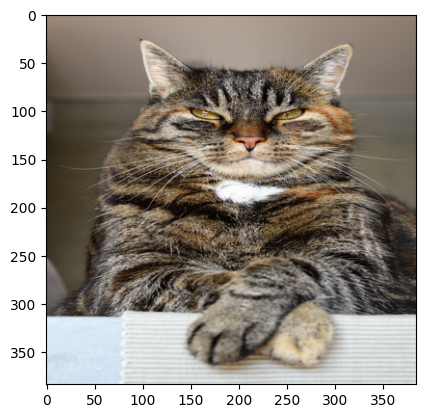

In [5]:
plt.imshow(HR_train[65])

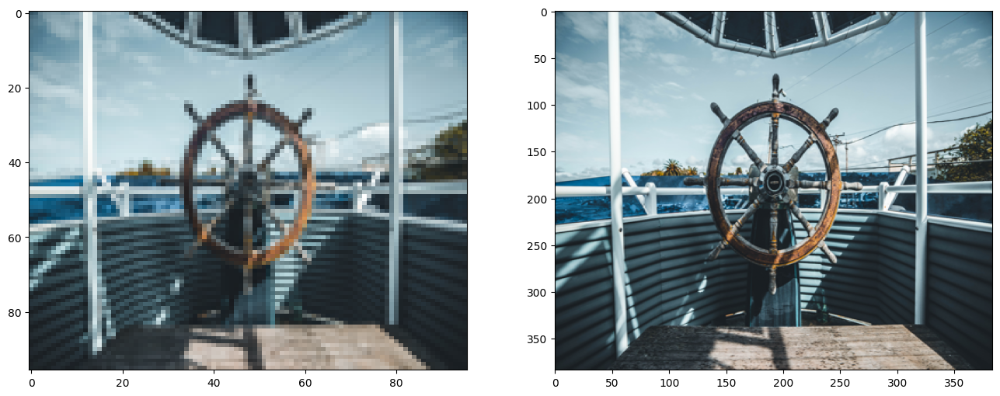

In [6]:
f, ax = plt.subplots(1,2, figsize=(16, 6))
ax[0].imshow(LR_train[save_ind], aspect='auto')
ax[1].imshow(HR_train[save_ind], aspect='auto')
plt.show()

## Model Architecture

In [7]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Flatten, Dense, add, BatchNormalization, Activation, LeakyReLU, Layer

from tensorflow.keras.models import Model

2023-02-05 12:03:20.903356: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [8]:
## subpixel class
class SubpixelConv2D(Layer):

    def __init__(self, upsampling_factor=2, **kwargs):
        super(SubpixelConv2D, self).__init__(**kwargs)
        self.upsampling_factor = upsampling_factor

    def build(self, input_shape):
        last_dim = input_shape[-1]
        factor = self.upsampling_factor * self.upsampling_factor
        if last_dim % (factor) != 0:
            raise ValueError('ERROR')

    def call(self, inputs, **kwargs):
        return tf.nn.depth_to_space( inputs, self.upsampling_factor )

    def get_config(self):
        config = { 'upsampling_factor': self.upsampling_factor, }
        base_config = super(SubpixelConv2D, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def compute_output_shape(self, input_shape):
        factor = self.upsampling_factor * self.upsampling_factor
        input_shape_1 = None
        if input_shape[1] is not None:
            input_shape_1 = input_shape[1] * self.upsampling_factor
        input_shape_2 = None
        if input_shape[2] is not None:
            input_shape_2 = input_shape[2] * self.upsampling_factor
        dims = [ input_shape[0],
                 input_shape_1,
                 input_shape_2,
                 int(input_shape[3]/factor)
               ]
        return tuple( dims )

In [9]:
## generator
def get_G(input_shape):
    # w_init = tf.random_normal_initializer(stddev=0.02)
    g_init = tf.random_normal_initializer(1., 0.02)
    relu = Activation('relu')

    nin = Input(shape = input_shape)
    n = Conv2D(64, (3,3), padding='SAME', activation= 'relu',
                        kernel_initializer='HeNormal')(nin)
    temp = n


    ## B residual blocks
    for i in range(3):
        nn = Conv2D(64, (3,3), padding='SAME', kernel_initializer='HeNormal')(n)
        nn = BatchNormalization(gamma_initializer= g_init)(nn)
        nn = relu(nn)
        nn = Conv2D(64, (3,3), padding='SAME', kernel_initializer='HeNormal')(n)
        nn = BatchNormalization(gamma_initializer= g_init)(nn)

        nn = add([n, nn])
        n = nn

    n = Conv2D(64, (3,3), padding='SAME', kernel_initializer='HeNormal')(n)
    n = BatchNormalization(gamma_initializer= g_init)(n)
    n = add([n, temp])
    # B residual blacks end

    n = Conv2D(256, (3,3), padding='SAME', kernel_initializer='HeNormal')(n)
    n = SubpixelConv2D(upsampling_factor=2)(n)
    n = relu(n)

    n = Conv2D(256, (3,3), padding='SAME', kernel_initializer='HeNormal')(n)
    n = SubpixelConv2D(upsampling_factor=2)(n)
    n = relu(n)

    nn = Conv2D(3, (1,1), padding='SAME', kernel_initializer='HeNormal', activation= 'tanh')(n)


    G = Model(inputs=nin, outputs=nn, name="generator")
    return G


## discriminator
def get_D(input_shape):

    g_init = tf.random_normal_initializer(1., 0.02)
    ly_relu = LeakyReLU(alpha= 0.2)
    df_dim = 16

    nin = Input(input_shape)
    n = Conv2D(64, (4, 4), (2, 2), padding='SAME', kernel_initializer='HeNormal')(nin)
    n = ly_relu(n)

    for i in range(2, 6):
        n = Conv2D(df_dim*(2**i),(4, 4), (2, 2), padding='SAME', kernel_initializer='HeNormal')(n)
        n = ly_relu(n)
        n = BatchNormalization(gamma_initializer= g_init)(n)

    n = Conv2D(df_dim*16, (1, 1), (1, 1), padding='SAME', kernel_initializer='HeNormal')(n)
    n = ly_relu(n)
    n = BatchNormalization(gamma_initializer= g_init)(n)

    n = Conv2D(df_dim*8, (1, 1), (1, 1), padding='SAME', kernel_initializer='HeNormal')(n)
    n = BatchNormalization(gamma_initializer= g_init)(n)
    temp = n

    n = Conv2D(df_dim*4, (3, 3), (1, 1), padding='SAME', kernel_initializer='HeNormal')(n)
    n = ly_relu(n)
    n = BatchNormalization(gamma_initializer= g_init)(n)

    n = Conv2D(df_dim*8, (3, 3), (1, 1), padding='SAME', kernel_initializer='HeNormal')(n)
    n = BatchNormalization(gamma_initializer= g_init)(n)

    n = add([n, temp])

    n = Flatten()(n)
    no = Dense(units=1, kernel_initializer='HeNormal', activation= 'sigmoid')(n)
    D = Model(inputs=nin, outputs=no, name="discriminator")

    return D


## VGG19 model
def get_vgg19():
    vgg= tf.keras.applications.VGG19( include_top=False, weights='imagenet', 
                                    input_tensor=None, input_shape=(384, 384, 3),
                                    pooling=None, classes=1000, classifier_activation='softmax' )

    inp= Input(shape=(384, 384, 3))
    x = vgg.layers[0](inp)
    for ly in vgg.layers[1:17]:
        x = ly(x)
    VGG19 = Model(inp, x)

    return VGG19

## Instantiate Models

In [10]:
G = get_G((96, 96, 3))
D = get_D((384, 384, 3))
vgg = get_vgg19()

2023-02-05 12:03:22.899228: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-05 12:03:24.136091: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22293 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:81:00.0, compute capability: 8.6
2023-02-05 12:03:24.136777: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22293 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:82:00.0, compute capability: 8.6


In [11]:
# Optimizers
g_optimizer_init = tf.optimizers.Adam(lr_v)
g_optimizer = tf.optimizers.Adam(lr_v)
d_optimizer = tf.optimizers.Adam(lr_v)

## Initialize Learning

In [12]:
n_step_epoch = round(n_epoch_init // batch_size)
for epoch in range(n_epoch_init):
    i,j= ((epoch)*batch_size)%tot_sample, (((epoch+1))*batch_size)%tot_sample
    if j== 0:
    j= -1
    X, Y= LR_train[i: j], HR_train[i: j]
    with tf.GradientTape() as tape:
        ypred= G(X)
        mse_loss= tf.reduce_mean(tf.reduce_mean(tf.math.squared_difference(Y, ypred), axis=-1))
        grad = tape.gradient(mse_loss, G.trainable_weights)
        g_optimizer_init.apply_gradients(zip(grad, G.trainable_weights))

    print("Epoch: [{}/{}] step: mse: {:.3f} ".format(
            epoch, n_epoch_init , mse_loss))
    if epoch%10 ==0:
    img= G.predict(LR_train[np.newaxis, save_ind])[0]
    #img= (img-img.mean())/img.std()
    img= Image.fromarray(np.uint8(img*255))
    img.save(os.path.join(save_dir, 'init_g_{}.png'.format(epoch)))


2023-02-05 12:03:26.398433: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8100
2023-02-05 12:03:28.171215: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:630] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-02-05 12:03:28.873988: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x2704fcd0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-02-05 12:03:28.874033: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2023-02-05 12:03:28.874043: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2023-02-05 12:03:28.880108: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-02-05 12:0

Epoch: [0/5020] step: mse: 0.806 
1/1 [==============================] - 0s 302ms/step
Epoch: [1/5020] step: mse: 0.640 
Epoch: [2/5020] step: mse: 0.489 
Epoch: [3/5020] step: mse: 0.384 
Epoch: [4/5020] step: mse: 0.413 
Epoch: [5/5020] step: mse: 0.350 
Epoch: [6/5020] step: mse: 0.338 
Epoch: [7/5020] step: mse: 0.263 
Epoch: [8/5020] step: mse: 0.349 
Epoch: [9/5020] step: mse: 0.271 
Epoch: [10/5020] step: mse: 0.257 
1/1 [==============================] - 0s 28ms/step
Epoch: [11/5020] step: mse: 0.238 
Epoch: [12/5020] step: mse: 0.214 
Epoch: [13/5020] step: mse: 0.215 
Epoch: [14/5020] step: mse: 0.197 
Epoch: [15/5020] step: mse: 0.174 
Epoch: [16/5020] step: mse: 0.202 
Epoch: [17/5020] step: mse: 0.177 
Epoch: [18/5020] step: mse: 0.160 
Epoch: [19/5020] step: mse: 0.176 
Epoch: [20/5020] step: mse: 0.159 
1/1 [==============================] - 0s 28ms/step
Epoch: [21/5020] step: mse: 0.128 
Epoch: [22/5020] step: mse: 0.160 
Epoch: [23/5020] step: mse: 0.121 
Epoch: [24/50

IndexError: index 5 is out of bounds for axis 0 with size 5

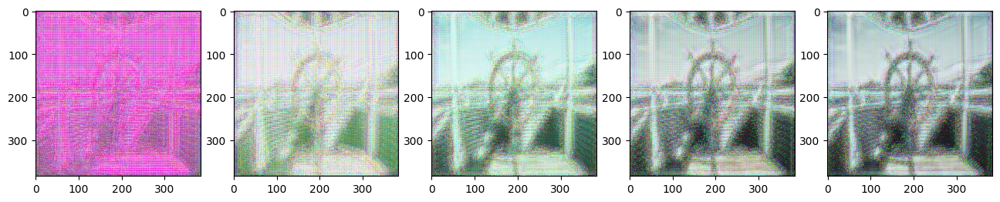

In [13]:
f, ax = plt.subplots(1, 5, figsize=(16, 6))
for i, file in enumerate(glob.glob('./samples/init*')):
    img = load(file, shape=(384, 384))
    ax[i].imshow(img)
plt.show()    

## Model Training

In [14]:
n_epoch= n_epoch-200
for epoch in range(n_epoch):
        i,j= ((epoch)*batch_size)%tot_sample, (((epoch+1))*batch_size)%tot_sample
        if j== 0:
            j= -1
        X, Y= LR_train[i: j], HR_train[i: j]
        with tf.GradientTape(persistent=True) as tape:
            fake_img= G(X)
            fake_logits= D(fake_img)
            real_logits= D(Y)
            fake_feature= vgg(fake_img)
            real_feature= vgg(Y)

            ## discriminator loss
            d_loss1= tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(fake_logits , tf.zeros_like(fake_logits)))
            d_loss2= tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(real_logits,tf.ones_like(real_logits)))
            d_loss= d_loss1 + d_loss2

            ## generator loss
            g_gan_loss= 2e-3*tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(fake_logits , tf.ones_like(fake_logits)))
            mse_loss=  2e-1* tf.reduce_mean(tf.reduce_mean(tf.math.squared_difference(fake_img, Y), axis=-1))
            vgg_loss = 2e-6 * tf.reduce_mean(tf.reduce_mean(tf.math.squared_difference(fake_feature, real_feature), axis=-1))
            g_loss = mse_loss + vgg_loss + g_gan_loss

            grad = tape.gradient(g_loss, G.trainable_weights)
            g_optimizer.apply_gradients(zip(grad, G.trainable_weights))
            grad = tape.gradient(d_loss, D.trainable_weights)
            d_optimizer.apply_gradients(zip(grad, D.trainable_weights))

        print("Epoch: [{}/{}] step: D.loss: {:.3f}: G.loss: {:.3f}".format(
                epoch, n_epoch , d_loss, g_loss))


        if epoch%20 ==0:
            img = G.predict(LR_train[np.newaxis, save_ind])[0]
            img = Image.fromarray(np.uint8(img*255))
            img.save(os.path.join(save_dir, 'train_g_{}.png'.format(epoch)))

Epoch: [0/50000] step: D.loss: 1.762: G.loss: 0.003
1/1 [==============================] - 0s 28ms/step
Epoch: [1/50000] step: D.loss: 1.008: G.loss: 0.002
Epoch: [2/50000] step: D.loss: 1.006: G.loss: 0.003
Epoch: [3/50000] step: D.loss: 1.007: G.loss: 0.002
Epoch: [4/50000] step: D.loss: 1.006: G.loss: 0.002
Epoch: [5/50000] step: D.loss: 1.006: G.loss: 0.003
Epoch: [6/50000] step: D.loss: 1.006: G.loss: 0.002
Epoch: [7/50000] step: D.loss: 1.006: G.loss: 0.002
Epoch: [8/50000] step: D.loss: 1.006: G.loss: 0.003
Epoch: [9/50000] step: D.loss: 1.006: G.loss: 0.002
Epoch: [10/50000] step: D.loss: 1.006: G.loss: 0.002
Epoch: [11/50000] step: D.loss: 1.006: G.loss: 0.002
Epoch: [12/50000] step: D.loss: 1.006: G.loss: 0.002
Epoch: [13/50000] step: D.loss: 1.006: G.loss: 0.002
Epoch: [14/50000] step: D.loss: 1.006: G.loss: 0.002
Epoch: [15/50000] step: D.loss: 1.006: G.loss: 0.002
Epoch: [16/50000] step: D.loss: 1.006: G.loss: 0.002
Epoch: [17/50000] step: D.loss: 1.006: G.loss: 0.002
Epoc

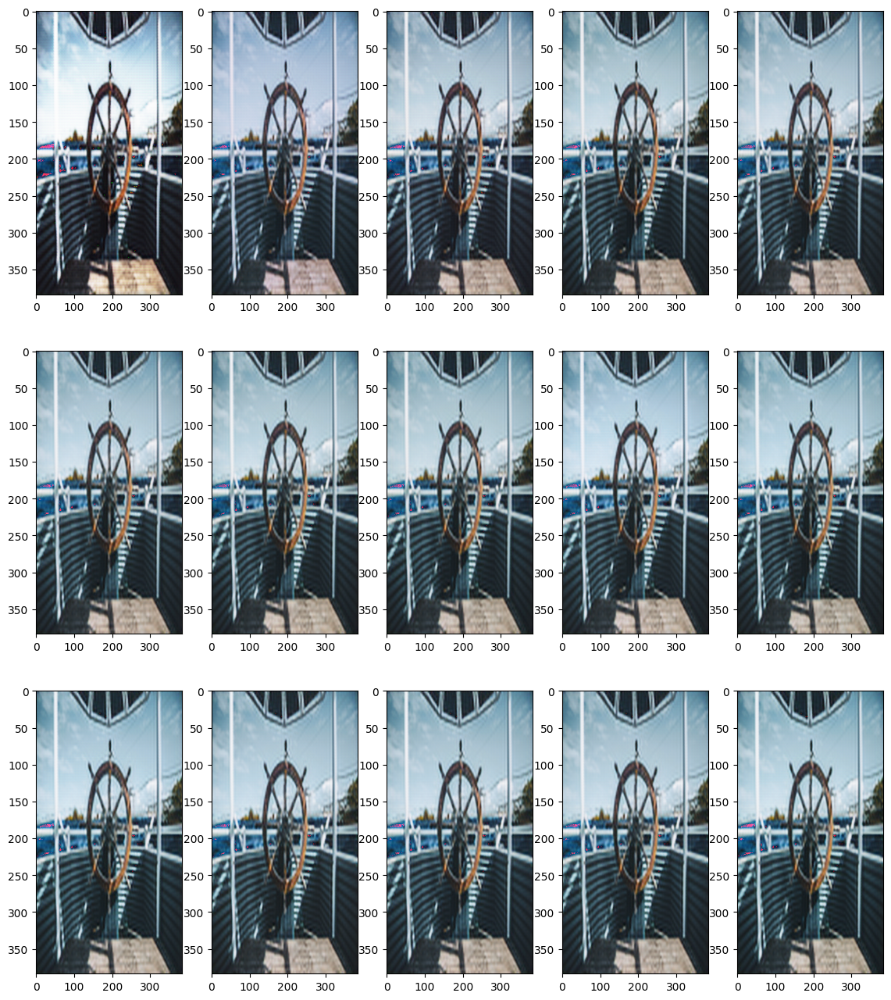

In [15]:
f, ax= plt.subplots(3,5, figsize=(14, 16))
for i, file in enumerate(glob.glob('./samples/train*')[:15]):
    img= load(file, shape=(384, 384))
    ax[i//5][i%5].imshow(img, aspect='auto')
plt.show()    

## Results

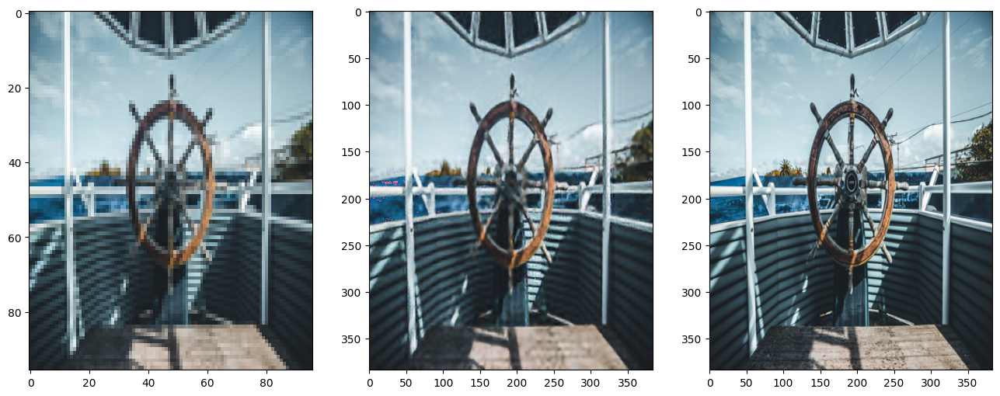

In [16]:
f, ax= plt.subplots(1,3, figsize=(16, 6))
ax[0].imshow(LR_train[save_ind], aspect='auto')
ax[1].imshow(load(glob.glob('./samples/train*')[-1], (384, 384)), aspect='auto')
ax[2].imshow(HR_train[save_ind], aspect='auto')
plt.show()

## Additional Samples

1/1 [==============================] - 0s 26ms/step


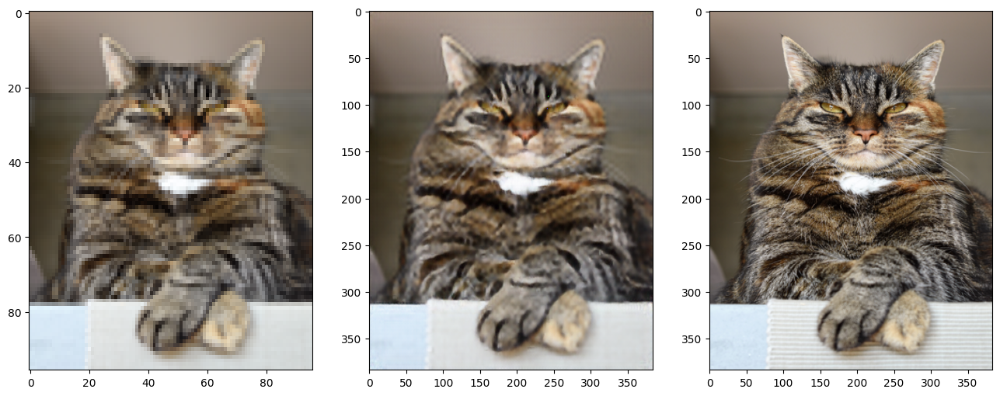

In [17]:
f, ax= plt.subplots(1,3, figsize=(16, 6))
ax[0].imshow(LR_train[65], aspect='auto')
img = G.predict(LR_train[np.newaxis, 65])[0]
img = Image.fromarray(np.uint8(img*255))
ax[1].imshow(img, aspect='auto')
ax[2].imshow(HR_train[65], aspect='auto')
plt.show()

1/1 [==============================] - 0s 26ms/step


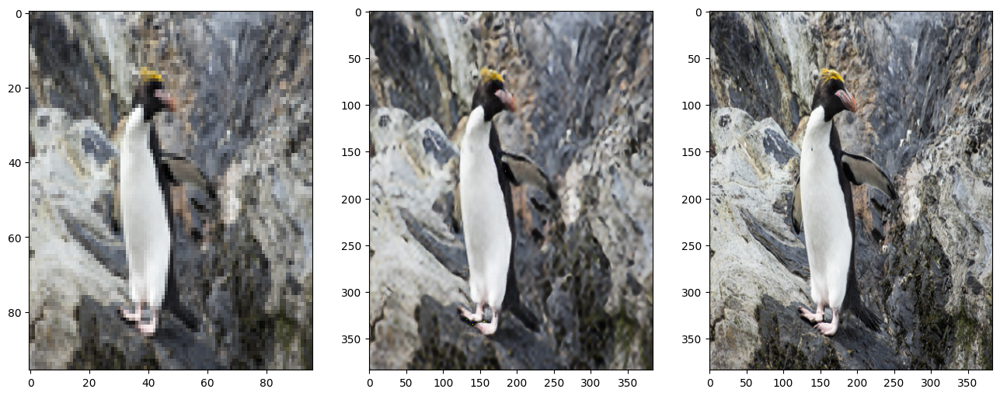

In [18]:
f, ax= plt.subplots(1,3, figsize=(16, 6))
ax[0].imshow(LR_train[0], aspect='auto')
img = G.predict(LR_train[np.newaxis, 0])[0]
img = Image.fromarray(np.uint8(img*255))
ax[1].imshow(img, aspect='auto')
ax[2].imshow(HR_train[0], aspect='auto')
plt.show()